In [1]:
import pandas as pd 
import seaborn as sns
import numpy as np
import scipy.stats as sts
import statsmodels.api as sm 
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler 
import matplotlib.pyplot as plt 
import plotly.express as px
%matplotlib inline 

In [2]:
base =pd.read_csv("train.csv")
base.shape

(1460, 81)

In [3]:
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

MSSubClass está como inteiro porém é uma variável categórica por isso é importante fazer esta transformação

In [4]:
base['MSSubClass'] = base['MSSubClass'].astype(object)

In [5]:
base.drop(['Id'], axis=1, inplace=True)

In [6]:
#base.columns

In [7]:
#base.describe()

Casa vendida pelo maior valor

In [8]:
base[base['SalePrice']== base['SalePrice'].max()].T

,691
MSSubClass,60
MSZoning,RL
LotFrontage,104.0
LotArea,21535
Street,Pave
...,...
MoSold,1
YrSold,2007
SaleType,WD
SaleCondition,Normal


In [9]:
base[base['SalePrice']== base['SalePrice'].min()].T

,495
MSSubClass,30
MSZoning,C (all)
LotFrontage,60.0
LotArea,7879
Street,Pave
...,...
MoSold,11
YrSold,2009
SaleType,WD
SaleCondition,Abnorml


In [10]:
base.groupby('YrSold').mean()['SalePrice']

YrSold
2006    182549.458599
2007    186063.151976
2008    177360.838816
2009    179432.103550
2010    177393.674286
Name: SalePrice, dtype: float64

Pela média não se nota grande diferença, ou algum tipo de valorização pelo tempo, o ano que teve maior lucro médio em vendas
foi 2007

In [11]:
base.groupby('MoSold').mean()['SalePrice']

MoSold
1     183256.258621
2     177882.000000
3     183253.924528
4     171503.262411
5     172307.269608
6     177395.735178
7     186331.192308
8     184651.827869
9     195683.206349
10    179563.977528
11    192210.911392
12    186518.966102
Name: SalePrice, dtype: float64

In [12]:
inteiro=base.select_dtypes(include='int64')
inteiro.columns


Index(['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [13]:
categorica=base.select_dtypes(include='object')
categorica.columns

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC',
       'Fence', 'MiscFeature', 'SaleType', 'SaleCondition'],
      dtype='object')

In [14]:
decimal=base.select_dtypes(include='float64')
decimal.columns

Index(['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], dtype='object')

Gráficos mais relevantes:

<AxesSubplot:xlabel='BsmtFullBath', ylabel='SalePrice'>

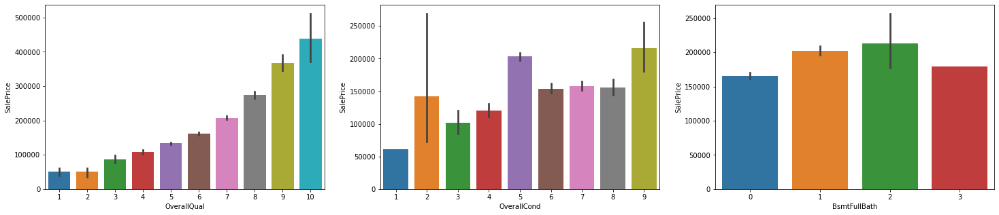

In [15]:
fig, axes = plt.subplots(1, 3, figsize=(25,5))

sns.barplot(x='OverallQual', y='SalePrice',data = base, ax = axes[0])
sns.barplot(x='OverallCond', y='SalePrice',data = base, ax = axes[1])
sns.barplot(x='BsmtFullBath', y='SalePrice',data = base, ax = axes[2])

-Como esperado as casas com melhor classificação de qualidade são as mais caras

<AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='SalePrice'>

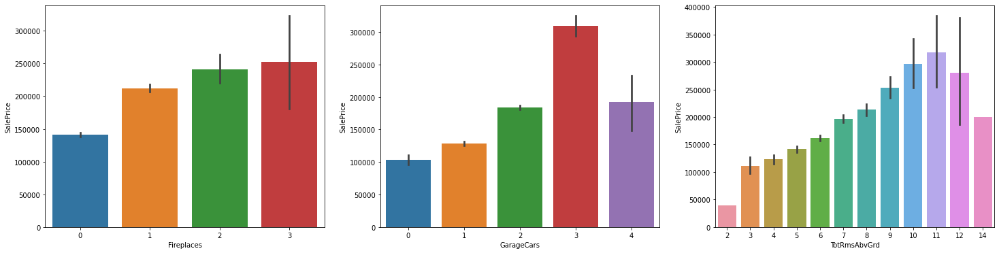

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(25,6))

sns.barplot(x='Fireplaces', y='SalePrice',data = base, ax = axes[0])
sns.barplot(x='GarageCars', y='SalePrice',data = base, ax = axes[1])
sns.barplot(x='TotRmsAbvGrd', y='SalePrice',data = base, ax = axes[2])


-Os 3 gráficos acima expressam a relação direta entre quantidade e preços, no caso quanto mais pontos de incendio, vagas na garagem e comodos maior o valor da casa. 

-Em casas com 3 pontos de incendio temos um alto desvio padrão pelo baixo de números de casos na base, o mesmo se aplica para as demais variaveis vistas acima. 

-A queda de valor vista em vagas na garagem e total de comodos é consequencia direta da baixa quantidade de casos na base. 

<AxesSubplot:xlabel='GarageCars', ylabel='SalePrice'>

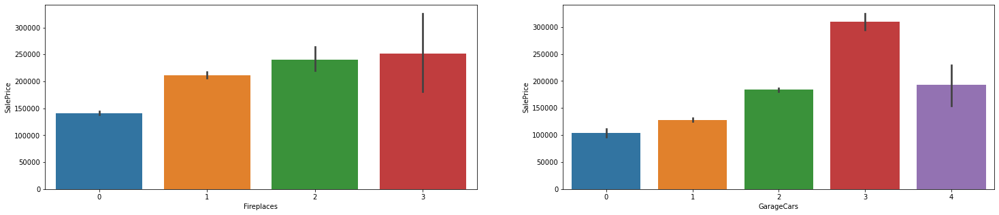

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(25,5))

sns.barplot(x='Fireplaces', y='SalePrice',data = base, ax = axes[0])
sns.barplot(x='GarageCars', y='SalePrice',data = base, ax = axes[1])

In [18]:
grafico = px.bar(base, x='YearBuilt', y='SalePrice')
grafico.show()

Acima pode-se dizer que quanto mais recente a construção provavelmente mais cara ela será no momento de venda

<AxesSubplot:xlabel='LotShape', ylabel='SalePrice'>

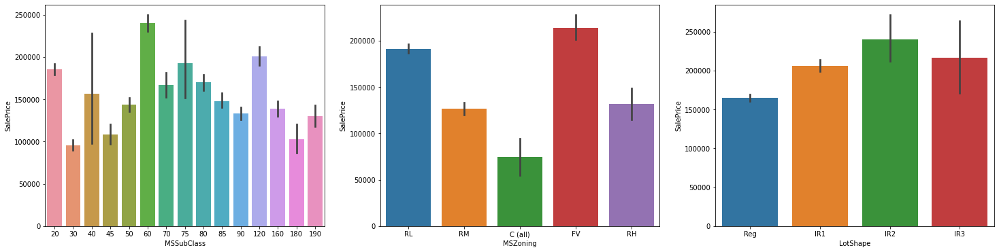

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(25,6))

sns.barplot(x='MSSubClass', y='SalePrice',data = base, ax = axes[0])
sns.barplot(x='MSZoning', y='SalePrice',data = base, ax = axes[1])
sns.barplot(x='LotShape', y='SalePrice',data = base, ax = axes[2])

In [20]:
for coluna in categorica.columns:
    grafico = px.box(base, x=coluna, y='SalePrice')
    grafico.show()

In [21]:
for coluna in decimal.columns:
    grafico = px.box(base, x=coluna, y='SalePrice')
    grafico.show()

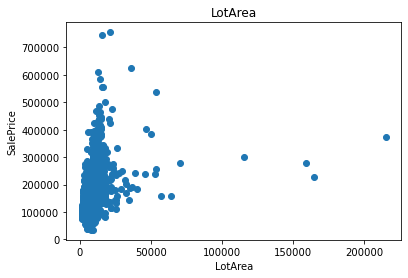

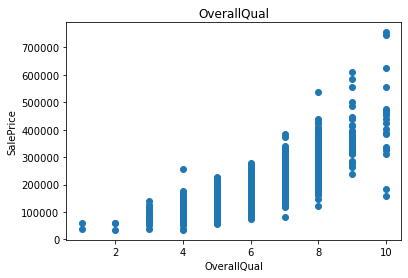

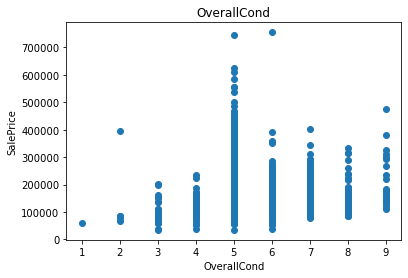

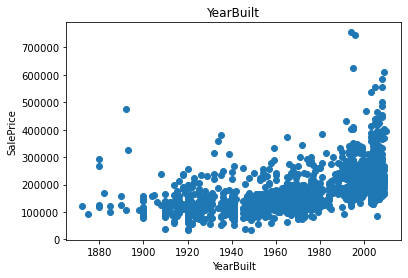

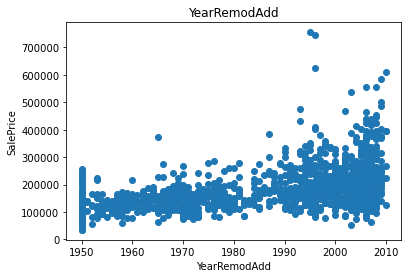

...

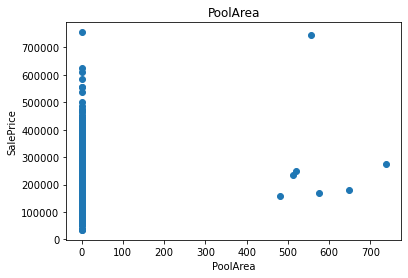

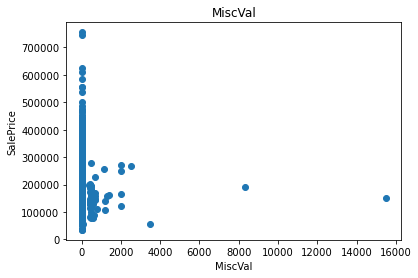

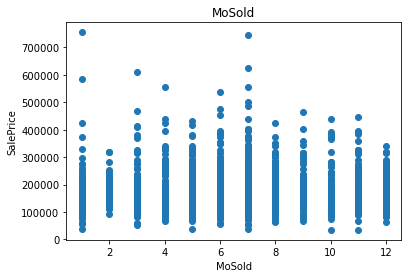

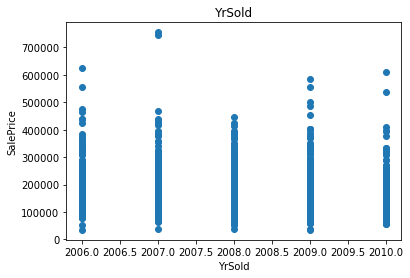

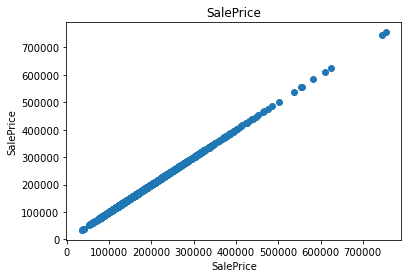

In [22]:
for i in inteiro:
    plt.scatter(base[i],base['SalePrice'])
    plt.title(i)
    plt.xlabel(i)
    plt.ylabel('SalePrice')
    plt.show()

<ipython-input-23-529a7cc57c78>:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



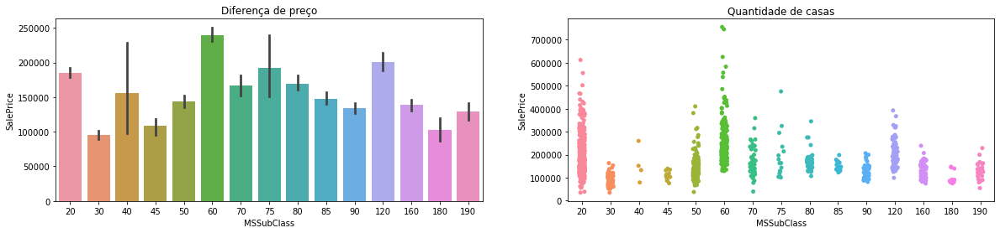

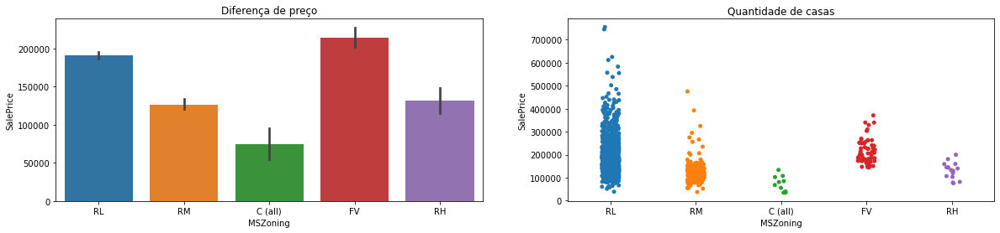

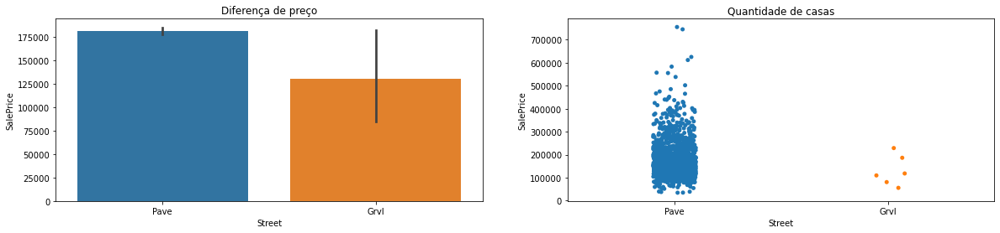

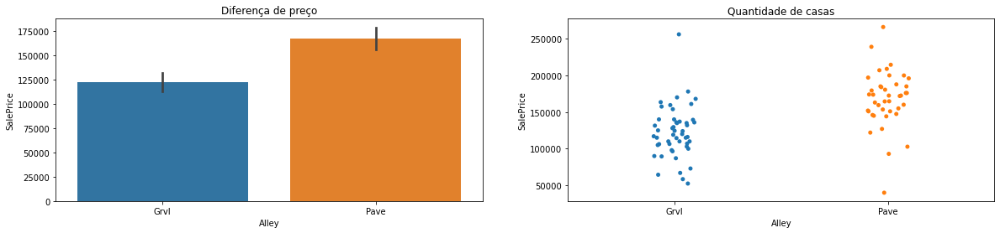

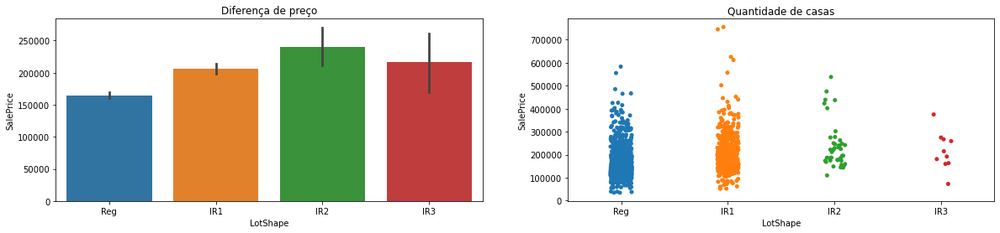

...

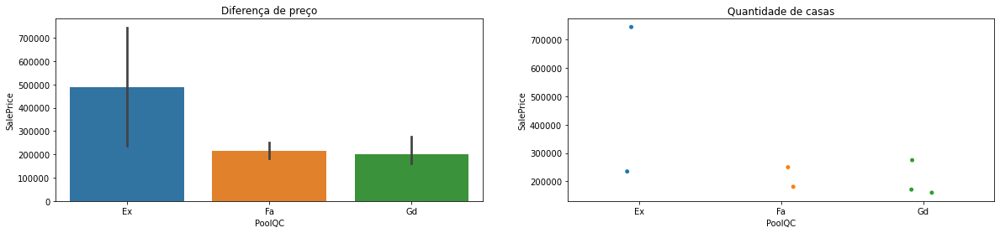

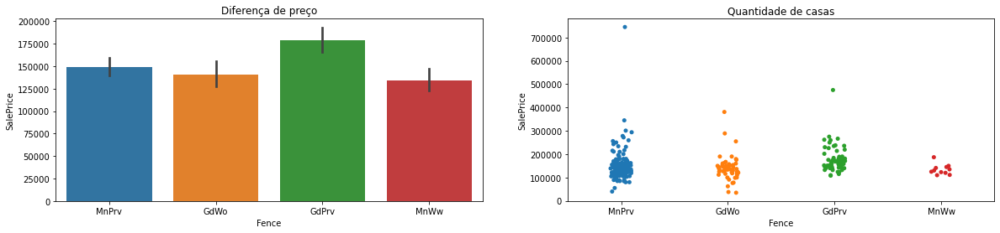

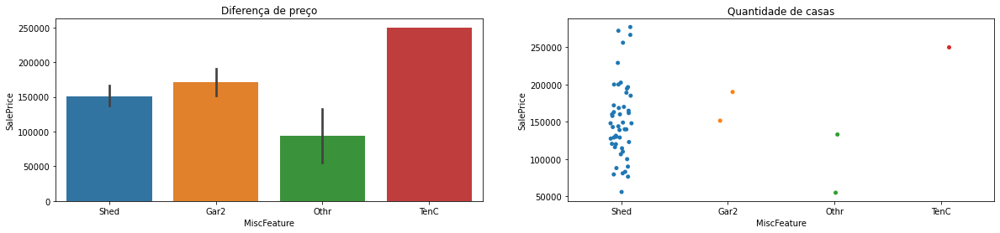

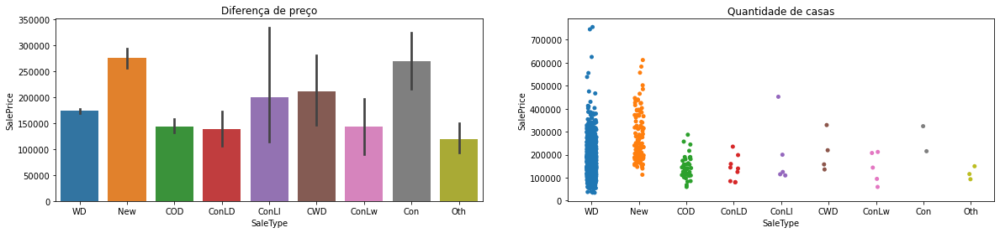

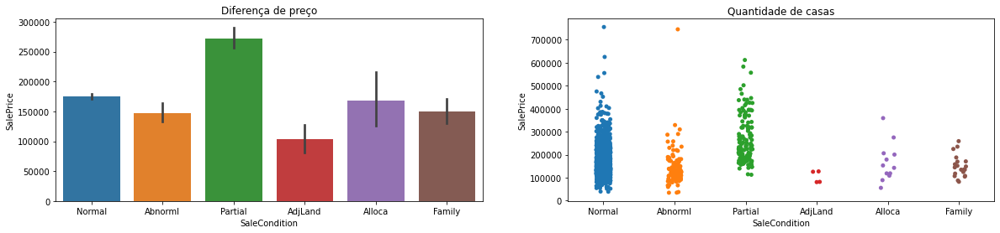

In [23]:
for i in categorica:
    plt.figure(figsize=(20,4))
    plt.subplots_adjust(hspace=.5)
    plt.subplot(1,2,1)
    plt.title('Diferença de preço')
    sns.barplot(x=i, y='SalePrice',data=base)
    plt.subplot(1,2,2)
    plt.title('Quantidade de casas')
    sns.stripplot(x=i, y='SalePrice',data=base)

In [24]:
base['GarageYrBlt'].fillna(value=base['GarageYrBlt'].median())

0       2003.0
1       1976.0
2       2001.0
3       1998.0
4       2000.0
         ...  
1455    1999.0
1456    1978.0
1457    1941.0
1458    1950.0
1459    1965.0
Name: GarageYrBlt, Length: 1460, dtype: float64

In [25]:
base['LotFrontage'].median()

69.0

In [26]:
base['LotFrontage'].fillna(69, inplace=True)

In [27]:
base['LotFrontage'].isnull().sum()

0

In [28]:
moda=['Electrical','GarageType','GarageQual','GarageCond','MasVnrType','BsmtQual','BsmtCond','BsmtExposure']
for column in moda:
    base[column].fillna(base[column].mode()[0], inplace=True)

In [29]:
categorica.drop(['FireplaceQu','PoolQC','MiscFeature'], axis=1, inplace=True)

C:\Users\012457631\Documents\Python Scripts\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
from category_encoders.one_hot import OneHotEncoder

In [31]:
dummies=OneHotEncoder(cols=categorica.columns)

In [32]:
fitDummy=dummies.fit_transform(categorica)

In [33]:
fitDummy.drop(['MSZoning_1', 'LotShape_1','LandContour_1', 'LotConfig_1', 'LandSlope_1',
       'Neighborhood_1', 'Condition1_1', 'BldgType_1', 'HouseStyle_1', 'RoofStyle_1',
       'Exterior1st_1', 'Exterior2nd_1', 'MasVnrType_1', 'ExterQual_1', 'ExterCond_1',
       'Foundation_1', 'BsmtQual_1', 'BsmtCond_1', 'BsmtExposure_1', 'HeatingQC_1',
       'KitchenQual_1', 'Functional_1', 'GarageType_1',
       'GarageFinish_1', 'GarageQual_1', 'GarageCond_1', 'PavedDrive_1',
       'SaleType_1', 'SaleCondition_1','MSSubClass_1','CentralAir_1','Electrical_1','Fence_1'], axis=1, inplace=True)

In [34]:
#fitDummy.head()

In [35]:
base.drop(['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'HeatingQC',
       'KitchenQual','Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'MiscFeature',
       'SaleType', 'SaleCondition','MSSubClass','CentralAir','Electrical','PoolQC','Fence'], axis=1, inplace=True)

In [36]:
for i in fitDummy:
    base[i]=fitDummy[i]
base

,LotFrontage,LotArea,Street,Alley,Utilities,Condition2,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,SaleType_5,SaleType_6,SaleType_7,SaleType_8,SaleType_9,SaleCondition_2,SaleCondition_3,SaleCondition_4,SaleCondition_5,SaleCondition_6
0,65.0,8450,Pave,NaN,AllPub,Norm,7,5,2003,2003,...,0,0,0,0,0,0,0,0,0,0
1,80.0,9600,Pave,NaN,AllPub,Norm,6,8,1976,1976,...,0,0,0,0,0,0,0,0,0,0
2,68.0,11250,Pave,NaN,AllPub,Norm,7,5,2001,2002,...,0,0,0,0,0,0,0,0,0,0
3,60.0,9550,Pave,NaN,AllPub,Norm,7,5,1915,1970,...,0,0,0,0,0,1,0,0,0,0
4,84.0,14260,Pave,NaN,AllPub,Norm,8,5,2000,2000,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,62.0,7917,Pave,NaN,AllPub,Norm,6,5,1999,2000,...,0,0,0,0,0,0,0,0,0,0
1456,85.0,13175,Pave,NaN,AllPub,Norm,6,6,1978,1988,...,0,0,0,0,0,0,0,0,0,0
1457,66.0,9042,Pave,NaN,AllPub,Norm,7,9,1941,2006,...,0,0,0,0,0,0,0,0,0,0
1458,68.0,9717,Pave,NaN,AllPub,Norm,5,6,1950,1996,...,0,0,0,0,0,0,0,0,0,0


In [38]:
base.drop(['Alley','Street','Utilities','MasVnrArea', 'Condition2','RoofMatl',
          'Heating','BsmtFinSF2','LowQualFinSF','EnclosedPorch',
          '3SsnPorch','MiscVal','BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2'], axis=1, inplace=True)

In [39]:
base2=base.drop(columns=['SalePrice'])

In [40]:
base2.isnull().sum()

LotFrontage        0
LotArea            0
OverallQual        0
OverallCond        0
YearBuilt          0
                  ..
SaleCondition_2    0
SaleCondition_3    0
SaleCondition_4    0
SaleCondition_5    0
SaleCondition_6    0
Length: 263, dtype: int64

<AxesSubplot:>

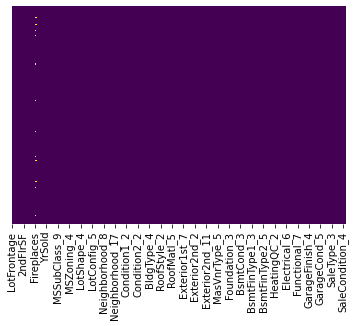

In [41]:
sns.heatmap(base.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [ ]:
X = base2
y = base['SalePrice']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=101)

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
lm = LinearRegression()

In [ ]:
lm.fit(X_train,y_train)